In [0]:
!pip install catboost

     |████████████████████████████████| 62.9MB 145kB/s 


In [0]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from sklearn.metrics import log_loss
from sklearn import cluster
from scipy.sparse import csr_matrix, hstack

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.metrics import roc_auc_score
# from sklearn.preprocessing import MinMaxScaler
# from sklearn.svm import SVR
from catboost import CatBoostClassifier

In [0]:
pd.set_option('display.max_columns', 5000)
pd.set_option('display.width', 10)
pd.set_option('display.max_rows', 1000)

# DATA LOAD

In [0]:
train_data = pd.read_csv('train.csv')
test_data = pd.read_csv('test.csv')

# Фичи для трейн дата / тест дата

## Count фичи
## Есть ли возвраты в чеке 

In [0]:
#обрабатывает исходный датафрейм
def count_feature_creator(data):
    
    def is_backcount(count):
        if count < 0:
            return count
        else:
            return 0
        
    def is_realcount(count):
        if count >= 0:
            return count
        else:
            return 0
    data['realcount'] = data['count'].apply(lambda x: is_realcount(x))
    data['backcount'] = data['count'].apply(lambda x: is_backcount(x))

## Time фичи

In [0]:
#обрабатывает исходный датафрейм
def time_creator(data_name):
    new_format = pd.to_datetime(data_name['time'])
    data_name['new_time'] = new_format.dt.hour * 60 + new_format.dt.minute
    data_name['hours'] = new_format.dt.hour
    data_name['day'] = np.cumsum(np.where(np.diff(data_name['new_time'], prepend = True)<0, 1, 0))
#     data_name['day'] = data_name['day'].astype('str').apply(lambda x : x)
    data_name['day_week'] = data_name['day']%7
    return data_name

## Customer фичи

In [0]:
def have_cust_feature(data,mode = 'train'):
    """
    Имеет ли чек кастомера, если кастомер есть, то дял всех позиций чека, проставим 1
    """
    if mode == 'train':
        data.customer_id = data.customer_id.fillna('no') # заменить наны на строку для удобства
    
    cust_train = set(data.customer_id.unique())

    def have_cust(x,cust_train):
        if x == 'no':
            return 0
        elif x in cust_train:
            return 1

    data['have_cust'] = data.customer_id.apply(lambda x : have_cust(x,cust_train))
        

In [0]:
def is_k_cust_id_feature(data,k=30):
    def find_same_cust_id(train_data=train_data,test_data=test_data):
        """
        Узнаем количество чеков в тесте,которые есть в трейне:

        orig_list - список  304 встречающихся cust_id
        """

        cust_test = set(test_data.customer_id.unique())
        cust_train = set(train_data.customer_id.unique())
        orig_list = []
        for i in cust_train:
            if i in cust_test:
                orig_list.append(i)
        return orig_list
    def get_n_most_encountered_cust_id(n=30,test_data=test_data):
        """
        выберем n наиболее встречающихся cust_id
        """
        orig_list = find_same_cust_id()

        c_304_cust_id_in_test_drom_train = list(test_data.groupby('customer_id').count().sort_values('check_id',ascending = False).loc[sorted(orig_list),:].sort_values('check_id',ascending = False).reset_index().customer_id.unique())
        most_encountered_cust_id = c_304_cust_id_in_test_drom_train[:n]
        return set(most_encountered_cust_id)

    def add_encountered_cust_id(id_str,most_encountered_cust_id):
        if id_str in most_encountered_cust_id:
            return id_str
        else:
            return 'other'
        
    most_encountered_cust_id = get_n_most_encountered_cust_id(n=k)
    data['is_c_cust_id'] = data.customer_id.apply(lambda x : add_encountered_cust_id(x,most_encountered_cust_id))

In [0]:
def check_to_dict(data):
    """
    Создает словарь с порядковым номером для чека.
    Каждая строчка в чеке имеет порядковый номер чека
    """
    list_of_namecheck = list(data.check_id.values)
    dict_of_namecheck = {}
    m = 1
    for i in list_of_namecheck:
        if i in dict_of_namecheck:
            pass
        else:
            dict_of_namecheck[i] = m
            m+=1
    return dict_of_namecheck
  
def create_feature_num_check(data):
    check_dict = check_to_dict(data)
    data['num_check'] = data.check_id.apply(lambda x: check_dict[x])

# Препроцессинг для обучения

In [0]:
def data_transform(data,mode='train'):
    """
    Создание эмбедингов по категориям train_data
    """
    #эмбединги по категории 1
    #заменим nan категорию
    data.category_1 = data.category_1.fillna('NANcat')
    print('заменили  наны')
    category_matrix = pd.get_dummies(data['category_1']).groupby(data['check_id']).apply(max)
    print('cat_1 complete')
    
    #добавили в трейн дата порядковые номера чеков
    create_feature_num_check(data)
    
    #эмбединги по категории 1
    chunk = data[data.num_check <= 20000]
    chunk_2 = data[(data.num_check > 20000) & (data.num_check <= 40000)]
    chunk_3 = data[data.num_check > 40000]
    category_matrix_cat2 = pd.get_dummies(chunk['category_2']).groupby(chunk['check_id']).apply(max)
    print('cat_2 complete 30%')
    
    category_matrix_cat2_2 = pd.get_dummies(chunk_2['category_2']).groupby(chunk_2['check_id']).apply(max)
    
    print('cat_2 complete 60%')
    
    result = category_matrix_cat2.append(category_matrix_cat2_2, sort=True).fillna(value = 0).astype('uint8')
    
    category_matrix_cat3 = pd.get_dummies(chunk_3['category_2']).groupby(chunk_3['check_id']).apply(max)
    
    print('cat_2 complete 100%')
    
    final_result = category_matrix_cat3.append(result, sort=True).fillna(value = 0).astype('uint8')
    
    feature_matrix = category_matrix.join(final_result)
    
    
    # добавим самых встречаемых кастомеров
    
    cust_matrix = pd.get_dummies(data['is_c_cust_id']).groupby(data['check_id']).apply(max)
    
    print('cust_id complete 100%')
    
    feature_matrix = pd.concat([feature_matrix, cust_matrix], axis=1, sort=False)
    
    return feature_matrix
    

# Подготовим данные для модели

In [0]:
time_data = time_creator(train_data)
time_data_feature = time_creator(train_data).drop_duplicates('check_id').sort_values('check_id').set_index('check_id')[['new_time','hours','day','day_week']]
time_data_feature.new_time = time_data_feature.new_time.astype('float32')

In [0]:
count_feature_creator(train_data)
count_feature = train_data.groupby('check_id').sum()[['realcount','backcount']].astype('float32')

In [0]:
# have_cust_feature(train_data)
is_k_cust_id_feature(train_data,k=300)

In [0]:
train_data.category_2 = train_data.category_2.astype('str')
test_data.category_2 = test_data.category_2.astype('str')

In [0]:

feature_matrix = data_transform(data=train_data)

# sb = csr_matrix(feature_matrix)

заменили  наны
cat_1 complete
cat_2 complete 30%
cat_2 complete 60%
cat_2 complete 100%
cust_id complete 100%


In [0]:
feature_matrix.shape

(53929, 5326)

In [0]:
feature_matrix = pd.concat([feature_matrix,time_data_feature,count_feature],axis=1)

In [0]:
feature_matrix.drop(['day','other'],axis = 1,inplace = True)

# Такая же матрица для теста

In [0]:
time_data_test = time_creator(test_data)
time_data_feature_test = time_creator(test_data).drop_duplicates('check_id').sort_values('check_id').set_index('check_id')[['new_time','hours','day','day_week']]
time_data_feature_test.new_time = time_data_feature_test.new_time.astype('float32')

In [0]:
count_feature_creator(test_data)
count_feature_test = test_data.groupby('check_id').sum()[['realcount','backcount']].astype('float32')

In [0]:
# have_cust_feature(test_data)
is_k_cust_id_feature(test_data)

In [0]:
test_data.head()

,check_id,customer_id,time,category_1,category_2,barcode,count,new_time,hours,day,day_week,realcount,backcount,is_c_cust_id,num_check
0,c450ac110f1199627a3d3cd4099ea6fd,NaN,10:01,личная гигиена,2001,4740015685,1,601,10,0,0,1,0,other,1
1,43eb9e7195ed02083c71091aebb7c880,NaN,10:02,картины,3364,3400054443,1,602,10,0,0,1,0,other,2
2,3155fdeee349baebe5ef9aceb5ca1aa3,NaN,10:02,финансовые услуги,3366,68113178253,-1,602,10,0,0,0,-1,other,3
3,43eb9e7195ed02083c71091aebb7c880,NaN,10:02,одежда для мужчин,3277,84868303345,1,602,10,0,0,1,0,other,2
4,fbf98ab60340ba62a916d747de71a965,1548c8cc076e47c89123d72002938fc7,10:05,ювелирные изделия и солнечные очки,2052,489406591137,1,605,10,0,0,1,0,other,4


In [0]:
test_matrix = data_transform(data=test_data)


заменили  наны
cat_1 complete
cat_2 complete 30%
cat_2 complete 60%
cat_2 complete 100%
cust_id complete 100%


In [0]:
test_matrix = pd.concat([test_matrix,time_data_feature_test,count_feature_test],axis=1)

In [0]:
test_matrix.head()

NANcat  \
check_id                                   
0000ba6c5ba1f66b8765d980f9a4b541       0   
000136a6790464a83877b1f7513e3487       0   
0002ae698b91b10f9c39a99aaed1fc2c       0   
0006d7b562f363d54725bb4e0d63531a       0   
000ac9fc6e818cabcbcdb8bb4cc85c98       0   

                                  аксессуары  \
check_id                                       
0000ba6c5ba1f66b8765d980f9a4b541           0   
000136a6790464a83877b1f7513e3487           0   
0002ae698b91b10f9c39a99aaed1fc2c           0   
0006d7b562f363d54725bb4e0d63531a           0   
000ac9fc6e818cabcbcdb8bb4cc85c98           0   

                                  алкоголь  \
check_id                                     
0000ba6c5ba1f66b8765d980f9a4b541         0   
000136a6790464a83877b1f7513e3487         0   
0002ae698b91b10f9c39a99aaed1fc2c         0   
0006d7b562f363d54725bb4e0d63531a         0   
000ac9fc6e818cabcbcdb8bb4cc85c98         0   

                                  беспроводная связь  \
check_id                                               
0000ba6c5ba1f66b8765d980f9a4b541                   0   
000136a6790464a83877b1f7513e3487                   0   
0002ae698b91b10f9c39a99aaed1fc2c                   0   
0006d7b562f363d54725bb4e0d63531a                   0   
000ac9fc6e818cabcbcdb8bb4cc85c98                   0   

                                  большие товары для дома  \
check_id                                                    
0000ba6c5ba1f66b8765d980f9a4b541                        0   
000136a6790464a83877b1f7513e3487                        0   
0002ae698b91b10f9c39a99aaed1fc2c                        0   
0006d7b562f363d54725bb4e0d63531a                        0   
000ac9fc6e818cabcbcdb8bb4cc85c98                        0   

                                  ванна и душ  \
check_id                                        
0000ba6c5ba1f66b8765d980f9a4b541            0   
000136a6790464a83877b1f7513e3487            0   
0002ae698b91b10f9c39a99aaed1fc2c            0   
0006d7b562f363d54725bb4e0d63531a            0   
000ac9fc6e818cabcbcdb8bb4cc85c98            0   

                                  велосипеды  \
check_id                                       
0000ba6c5ba1f66b8765d980f9a4b541           0   
000136a6790464a83877b1f7513e3487           0   
0002ae698b91b10f9c39a99aaed1fc2c           0   
0006d7b562f363d54725bb4e0d63531a           0   
000ac9fc6e818cabcbcdb8bb4cc85c98           0   

                                  все для компьютеров  \
check_id                                                
0000ba6c5ba1f66b8765d980f9a4b541                    0   
000136a6790464a83877b1f7513e3487                    0   
0002ae698b91b10f9c39a99aaed1fc2c                    0   
0006d7b562f363d54725bb4e0d63531a                    0   
000ac9fc6e818cabcbcdb8bb4cc85c98                    0   

                                  детские товары  \
check_id                                           
0000ba6c5ba1f66b8765d980f9a4b541               0   
000136a6790464a83877b1f7513e3487               0   
0002ae698b91b10f9c39a99aaed1fc2c               0   
0006d7b562f363d54725bb4e0d63531a               0   
000ac9fc6e818cabcbcdb8bb4cc85c98               0   

                                  домашний декор  \
check_id                                           
0000ba6c5ba1f66b8765d980f9a4b541               0   
000136a6790464a83877b1f7513e3487               0   
0002ae698b91b10f9c39a99aaed1fc2c               0   
0006d7b562f363d54725bb4e0d63531a               0   
000ac9fc6e818cabcbcdb8bb4cc85c98               0   

                                  доставка  \
check_id                                     
0000ba6c5ba1f66b8765d980f9a4b541         0   
000136a6790464a83877b1f7513e3487         1   
0002ae698b91b10f9c39a99aaed1fc2c         0   
0006d7b562f363d54725bb4e0d63531a         0   
000ac9fc6e818cabcbcdb8bb4cc85c98         0   

                                  другое  \
check_id                                   
0000ba6c5ba1f66b8765d9

In [0]:
test_matrix.shape

(13483, 4283)

In [0]:
feature_matrix.shape

(53929, 5062)

In [0]:
feature_matrix.head()

NANcat  \
check_id                                   
00001bf75a88b618291460d7891caedb       0   
00006bfbdd464516e2262e65de82c9fe       0   
000239aa0a67075aee38e1fd0d2c517f       0   
00031a2bc26078e840d82faf36de44b4       0   
000498b9b1cafc5e6c90d81dc432ce53       0   

                                  аксессуары  \
check_id                                       
00001bf75a88b618291460d7891caedb           0   
00006bfbdd464516e2262e65de82c9fe           0   
000239aa0a67075aee38e1fd0d2c517f           0   
00031a2bc26078e840d82faf36de44b4           0   
000498b9b1cafc5e6c90d81dc432ce53           0   

                                  алкоголь  \
check_id                                     
00001bf75a88b618291460d7891caedb         0   
00006bfbdd464516e2262e65de82c9fe         0   
000239aa0a67075aee38e1fd0d2c517f         0   
00031a2bc26078e840d82faf36de44b4         0   
000498b9b1cafc5e6c90d81dc432ce53         0   

                                  беспроводная связь  \
check_id                                               
00001bf75a88b618291460d7891caedb                   0   
00006bfbdd464516e2262e65de82c9fe                   0   
000239aa0a67075aee38e1fd0d2c517f                   0   
00031a2bc26078e840d82faf36de44b4                   0   
000498b9b1cafc5e6c90d81dc432ce53                   0   

                                  большие товары для дома  \
check_id                                                    
00001bf75a88b618291460d7891caedb                        0   
00006bfbdd464516e2262e65de82c9fe                        0   
000239aa0a67075aee38e1fd0d2c517f                        0   
00031a2bc26078e840d82faf36de44b4                        0   
000498b9b1cafc5e6c90d81dc432ce53                        0   

                                  ванна и душ  \
check_id                                        
00001bf75a88b618291460d7891caedb            0   
00006bfbdd464516e2262e65de82c9fe            0   
000239aa0a67075aee38e1fd0d2c517f            0   
00031a2bc26078e840d82faf36de44b4            0   
000498b9b1cafc5e6c90d81dc432ce53            0   

                                  велосипеды  \
check_id                                       
00001bf75a88b618291460d7891caedb           0   
00006bfbdd464516e2262e65de82c9fe           0   
000239aa0a67075aee38e1fd0d2c517f           0   
00031a2bc26078e840d82faf36de44b4           0   
000498b9b1cafc5e6c90d81dc432ce53           0   

                                  все для компьютеров  \
check_id                                                
00001bf75a88b618291460d7891caedb                    0   
00006bfbdd464516e2262e65de82c9fe                    0   
000239aa0a67075aee38e1fd0d2c517f                    0   
00031a2bc26078e840d82faf36de44b4                    0   
000498b9b1cafc5e6c90d81dc432ce53                    0   

                                  детские товары  \
check_id                                           
00001bf75a88b618291460d7891caedb               0   
00006bfbdd464516e2262e65de82c9fe               0   
000239aa0a67075aee38e1fd0d2c517f               0   
00031a2bc26078e840d82faf36de44b4               0   
000498b9b1cafc5e6c90d81dc432ce53               0   

                                  домашний декор  \
check_id                                           
00001bf75a88b618291460d7891caedb               0   
00006bfbdd464516e2262e65de82c9fe               0   
000239aa0a67075aee38e1fd0d2c517f               0   
00031a2bc26078e840d82faf36de44b4               0   
000498b9b1cafc5e6c90d81dc432ce53               0   

                                  доставка  \
check_id                                     
00001bf75a88b618291460d7891caedb         0   
00006bfbdd464516e2262e65de82c9fe         0   
000239aa0a67075aee38e1fd0d2c517f         0   
00031a2bc26078e840d82faf36de44b4         0   
000498b9b1cafc5e6c90d81dc432ce53         1   

                                  другое  \
check_id                                   
00001bf75a88b618291460

In [0]:
X = feature_matrix
y = train_data.drop_duplicates('check_id').sort_values('check_id')['target'].values

In [0]:
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.33, random_state=42)

In [0]:
clf= CatBoostClassifier(iterations=4000, learning_rate = 0.03, max_depth=12,
                             loss_function = 'MultiClass', verbose = True,
                            task_type = 'GPU')

In [0]:
categorical_features_indices = np.where(X_train.dtypes != np.float32)[0]
clf.fit(X_train, y_train,eval_set=(X_val,y_val))

0:	learn: 2.9829711	test: 2.9849312	best: 2.9849312 (0)	total: 1.35s	remaining: 1h 30m 16s
1:	learn: 2.8280152	test: 2.8308456	best: 2.8308456 (1)	total: 2.54s	remaining: 1h 24m 31s
2:	learn: 2.7059713	test: 2.7094169	best: 2.7094169 (2)	total: 3.48s	remaining: 1h 17m 23s
3:	learn: 2.6055769	test: 2.6096540	best: 2.6096540 (3)	total: 4.43s	remaining: 1h 13m 42s
4:	learn: 2.5195689	test: 2.5244107	best: 2.5244107 (4)	total: 5.52s	remaining: 1h 13m 30s
5:	learn: 2.4418869	test: 2.4467216	best: 2.4467216 (5)	total: 6.42s	remaining: 1h 11m 14s
6:	learn: 2.3760655	test: 2.3818066	best: 2.3818066 (6)	total: 7.53s	remaining: 1h 11m 33s
7:	learn: 2.3167686	test: 2.3232668	best: 2.3232668 (7)	total: 8.59s	remaining: 1h 11m 25s
8:	learn: 2.2598275	test: 2.2669448	best: 2.2669448 (8)	total: 9.54s	remaining: 1h 10m 30s
9:	learn: 2.2075139	test: 2.2148196	best: 2.2148196 (9)	total: 10.5s	remaining: 1h 10m 2s
10:	learn: 2.1641693	test: 2.1718939	best: 2.1718939 (10)	total: 11.4s	remaining: 1h 8m 49s

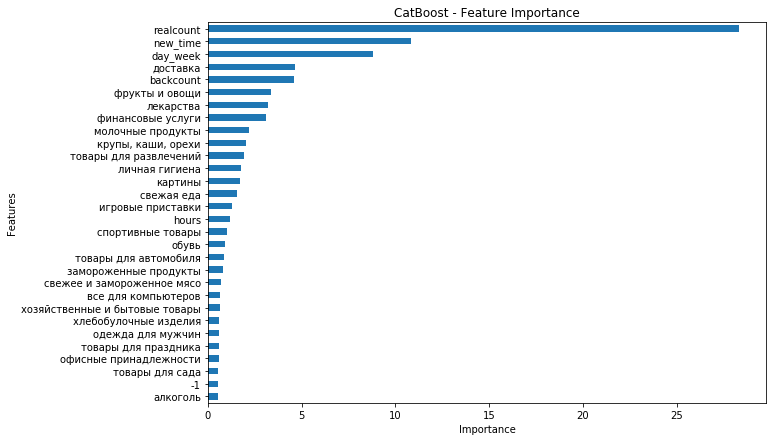

In [0]:
fea_imp = pd.DataFrame({'imp': clf.feature_importances_, 'col': X.columns})
fea_imp = fea_imp.sort_values(['imp', 'col'], ascending=[True, False]).iloc[-30:]
fea_imp.plot(kind='barh', x='col', y='imp', figsize=(10, 7), legend=None)
plt.title('CatBoost - Feature Importance')
plt.ylabel('Features')
plt.xlabel('Importance');

# Сохраним в сабмит результаты

In [0]:
row_names = list(test_matrix.index)
# category_matrix_test.drop('check_id',axis = 1,inplace=True)
to_sub = clf.predict_proba(test_matrix_test)

In [0]:
ids = row_names
columns_names = ['target_{}'.format(i) for i in range(25)]

df_result = pd.DataFrame(to_sub, columns=columns_names)
df_result.insert(0, 'check_id', ids)
df_result.head(10)

df_result.to_csv('submission_5.csv', index=False)

In [0]:
len(row_names)

78907

# Проверка шейпа сабмита

In [0]:
df_result.shape

(13483, 26)

In [0]:
df_result.insert(0, 'check_id', ids)

ValueError: ignored

In [0]:
to_sub.shape

(13483, 25)

# Доработаем test

In [0]:
new_row = feature_matrix.iloc[:1,:]

In [0]:
new_row

NANcat  \
check_id                                   
00001bf75a88b618291460d7891caedb       0   

                                  аксессуары  \
check_id                                       
00001bf75a88b618291460d7891caedb           0   

                                  алкоголь  \
check_id                                     
00001bf75a88b618291460d7891caedb         0   

                                  беспроводная связь  \
check_id                                               
00001bf75a88b618291460d7891caedb                   0   

                                  большие товары для дома  \
check_id                                                    
00001bf75a88b618291460d7891caedb                        0   

                                  ванна и душ  \
check_id                                        
00001bf75a88b618291460d7891caedb            0   

                                  велосипеды  \
check_id                                       
00001bf75a88b618291460d7891caedb           0   

                                  все для компьютеров  \
check_id                                                
00001bf75a88b618291460d7891caedb                    0   

                                  детские товары  \
check_id                                           
00001bf75a88b618291460d7891caedb               0   

                                  домашний декор  \
check_id                                           
00001bf75a88b618291460d7891caedb               0   

                                  доставка  \
check_id                                     
00001bf75a88b618291460d7891caedb         0   

                                  другое  \
check_id                                   
00001bf75a88b618291460d7891caedb       0   

                                  женская одежда  \
check_id                                           
00001bf75a88b618291460d7891caedb               0   

                                  женские носки  \
check_id                                          
00001bf75a88b618291460d7891caedb              0   

                                  замороженные продукты  \
check_id                                                  
00001bf75a88b618291460d7891caedb                      0   

                                  запакованная еда  \
check_id                                             
00001bf75a88b618291460d7891caedb                 0   

                                  игровые приставки  \
check_id                                              
00001bf75a88b618291460d7891caedb                  0   

                                  игрушки  \
check_id                                    
00001bf75a88b618291460d7891caedb        0   

                                  интимные товары  \
check_id                                            
00001bf75a88b618291460d7891caedb                0   

                                  камеры и аксессуары  \
check_id                                                
00001bf75a88b618291460d7891caedb                    0   

                                  картины  \
check_id                                    
00001bf75a88b618291460d7891caedb        0   

                                  книги и журналы  \
check_id                                            
00001bf75a88b618291460d7891caedb                0   

                                  колготки и чулки  \
check_id                                             
00001bf75a88b618291460d7891caedb                 0   

                                  кондитерские изделия и сладости  \
check_id                                                            
00001bf75a88b618291460d7891caedb                                0   

                                  косметика и аксессуары  \
check_id                                                   
00001bf75a88b618291460d7891caedb                       0   

                                  крупы, каши, орехи  \
check_id               

In [0]:
test_matrix_test = new_row.append(test_matrix,sort=False)

In [0]:
test_matrix_test.shape

(13484, 5138)

In [0]:
test_matrix_test.head()

NANcat  \
check_id                                   
00001bf75a88b618291460d7891caedb       0   
0000ba6c5ba1f66b8765d980f9a4b541       0   
000136a6790464a83877b1f7513e3487       0   
0002ae698b91b10f9c39a99aaed1fc2c       0   
0006d7b562f363d54725bb4e0d63531a       0   

                                  аксессуары  \
check_id                                       
00001bf75a88b618291460d7891caedb           0   
0000ba6c5ba1f66b8765d980f9a4b541           0   
000136a6790464a83877b1f7513e3487           0   
0002ae698b91b10f9c39a99aaed1fc2c           0   
0006d7b562f363d54725bb4e0d63531a           0   

                                  алкоголь  \
check_id                                     
00001bf75a88b618291460d7891caedb         0   
0000ba6c5ba1f66b8765d980f9a4b541         0   
000136a6790464a83877b1f7513e3487         0   
0002ae698b91b10f9c39a99aaed1fc2c         0   
0006d7b562f363d54725bb4e0d63531a         0   

                                  беспроводная связь  \
check_id                                               
00001bf75a88b618291460d7891caedb                   0   
0000ba6c5ba1f66b8765d980f9a4b541                   0   
000136a6790464a83877b1f7513e3487                   0   
0002ae698b91b10f9c39a99aaed1fc2c                   0   
0006d7b562f363d54725bb4e0d63531a                   0   

                                  большие товары для дома  \
check_id                                                    
00001bf75a88b618291460d7891caedb                        0   
0000ba6c5ba1f66b8765d980f9a4b541                        0   
000136a6790464a83877b1f7513e3487                        0   
0002ae698b91b10f9c39a99aaed1fc2c                        0   
0006d7b562f363d54725bb4e0d63531a                        0   

                                  ванна и душ  \
check_id                                        
00001bf75a88b618291460d7891caedb            0   
0000ba6c5ba1f66b8765d980f9a4b541            0   
000136a6790464a83877b1f7513e3487            0   
0002ae698b91b10f9c39a99aaed1fc2c            0   
0006d7b562f363d54725bb4e0d63531a            0   

                                  велосипеды  \
check_id                                       
00001bf75a88b618291460d7891caedb           0   
0000ba6c5ba1f66b8765d980f9a4b541           0   
000136a6790464a83877b1f7513e3487           0   
0002ae698b91b10f9c39a99aaed1fc2c           0   
0006d7b562f363d54725bb4e0d63531a           0   

                                  все для компьютеров  \
check_id                                                
00001bf75a88b618291460d7891caedb                    0   
0000ba6c5ba1f66b8765d980f9a4b541                    0   
000136a6790464a83877b1f7513e3487                    0   
0002ae698b91b10f9c39a99aaed1fc2c                    0   
0006d7b562f363d54725bb4e0d63531a                    0   

                                  детские товары  \
check_id                                           
00001bf75a88b618291460d7891caedb               0   
0000ba6c5ba1f66b8765d980f9a4b541               0   
000136a6790464a83877b1f7513e3487               0   
0002ae698b91b10f9c39a99aaed1fc2c               0   
0006d7b562f363d54725bb4e0d63531a               0   

                                  домашний декор  \
check_id                                           
00001bf75a88b618291460d7891caedb               0   
0000ba6c5ba1f66b8765d980f9a4b541               0   
000136a6790464a83877b1f7513e3487               0   
0002ae698b91b10f9c39a99aaed1fc2c               0   
0006d7b562f363d54725bb4e0d63531a               0   

                                  доставка  \
check_id                                     
00001bf75a88b618291460d7891caedb         0   
0000ba6c5ba1f66b8765d980f9a4b541         0   
000136a6790464a83877b1f7513e3487         1   
0002ae698b91b10f9c39a99aaed1fc2c         0   
0006d7b562f363d54725bb4e0d63531a         0   

                                  другое  \
check_id                                   
00001bf75a88b618291460

In [0]:
test_matrix_test = test_matrix_test.fillna(value = 0).astype('uint8')

In [0]:
test_matrix_test.shape

(13483, 4277)

In [0]:
%%time
test_matrix_test.drop('00001bf75a88b618291460d7891caedb',inplace = True)

CPU times: user 279 ms, sys: 19.4 ms, total: 298 ms
Wall time: 298 ms


In [0]:
test_matrix_test.shape

(13483, 5138)

In [0]:
feature_matrix.shape

(53929, 5062)

# Ненужное

In [0]:
set_train = set(train_data.category_2.unique())
list_test = list(set(test_data.category_2.unique()))

In [0]:
ggg = []
new_in_test = []
for i in list_test:
  if i in set_train:
    ggg.append(i)
  else:
    new_in_test.append(i)

In [0]:
test_matrix_test.drop(new_in_test,axis = 1,inplace = True)

In [0]:
test_matrix_test.shape

(13483, 5062)

In [0]:
test_matrix_test = test_matrix_test.fillna(value = 0).astype('uint8')